In [1]:
#SF Airbnb Open Data
NAME = "Sneha Somaya, Yin Yin Teo, Erin Liu, Chandrima Sabharwal"

**GOAL:** 

- Cluster AirBnB's in San Francisco based on quantitative and qualitative features with a geographical visualization to understand what kind of Airbnbs are similar

### **1. Setting up imports and data** 

In [2]:
#imports
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import re
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import normalize

%matplotlib inline

In [3]:
listings = pd.read_csv('/content/listings.csv.gz',engine='python',encoding = 'utf-8',error_bad_lines=False)
listings.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,958,https://www.airbnb.com/rooms/958,20201005145812,2020-10-05,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,https://www.airbnb.com/users/show/1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1,1,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, California, United States",Western Addition,NaN,37.76931,-122.43386,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Stove"", ""Refrigerator"", ""Coffee maker"", ""Iro...",$131.00,2,30,2,2,1125,1125,2.0,1125.0,NaN,t,10,16,33,206,2020-10-05,262,42,3,2009-07-23,2020-09-16,97.0,10.0,10.0,10.0,10.0,10.0,10.0,STR-0001256,f,1,1,0,0,1.92
1,5858,https://www.airbnb.com/rooms/5858,20201005145812,2020-10-05,Creative Sanctuary,<b>The space</b><br />We live in a large Victo...,I love how our neighborhood feels quiet but is...,https://a0.muscache.com/pictures/17714/3a7aea1...,8904,https://www.airbnb.com/users/show/8904,Philip And Tania,2009-03-02,"San Francisco, California, United States",Philip: English transplant to the Bay Area and...,within a day,100%,85%,f,https://a0.muscache.com/im/users/8904/profile_...,https://a0.muscache.com/im/users/8904/profile_...,Bernal Heights,2,2,"['email', 'phone', 'reviews', 'kba', 'work_ema...",t,t,"San Francisco, California, United States",Bernal Heights,NaN,37.74511,-122.42102,Entire apartment,Entire home/apt,5,NaN,1 bath,2.0,3.0,"[""Heating"", ""Smoke alarm"", ""Dryer"", ""Wifi"", ""F...",$235.00,30,60,30,30,60,60,30.0,60.0,NaN,t,30,60,90,365,2020-10-05,111,0,0,2009-05-03,2017-08-06,98.0,10.0,10.0,10.0,10.0,10.0,9.0,NaN,f,1,1,0,0,0.80
2,7918,https://www.airbnb.com/rooms/7918,20201005145812,2020-10-05,A Friendly Room - UCSF/USF - San Francisco,Nice and good public transportation. 7 minute...,"Shopping old town, restaurants, McDonald, Whol...",https://a0.muscache.com/pictures/26356/8030652...,21994,https://www.airbnb.com/users/show/21994,Aaron,2009-06-17,"San Francisco, California, United States",7 minutes walk to UCSF hospital & school campu...,NaN,NaN,100%,f,https://a0.muscache.com/im/users/21994/profile...,https://a0.muscache.com/im/users/21994/profile...,Cole Valley,10,10,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"San Francisco, California, United States",Haight Ashbury,NaN,37.76555,-122.45213,Private room in apartment,Private room,2,NaN,4 shared baths,1.0,1.0,"[""Heating""

In [4]:
reviews = pd.read_csv('/content/reviews.csv.gz',engine='python',encoding = 'utf-8',error_bad_lines=False)
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,958,5977,2009-07-23,15695,Edmund C,"Our experience was, without a doubt, a five st..."
1,958,6660,2009-08-03,26145,Simon,Returning to San Francisco is a rejuvenating t...
2,958,11519,2009-09-27,25839,Denis,We were very pleased with the accommodations a...
3,958,16282,2009-11-05,33750,Anna,We highly recommend this accomodation and agre...
4,958,26008,2010-02-13,15416,Venetia,Holly's place was great. It was exactly what I...


In [5]:
joined = pd.merge(listings, reviews, how='inner', left_on='id', right_on='listing_id')
joined.head()

,id_x,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,listing_id,id_y,date,reviewer_id,reviewer_name,comments
0,958,https://www.airbnb.com/rooms/958,20201005145812,2020-10-05,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,https://www.airbnb.com/users/show/1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1,1,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, California, United States",Western Addition,NaN,37.76931,-122.43386,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Stove"", ""Refrigerator"", ""Coffee maker"", ""Iro...",$131.00,2,30,2,2,1125,1125,2.0,1125.0,NaN,t,10,16,33,206,2020-10-05,262,42,3,2009-07-23,2020-09-16,97.0,10.0,10.0,10.0,10.0,10.0,10.0,STR-0001256,f,1,1,0,0,1.92,958,5977,2009-07-23,15695,Edmund C,"Our experience was, without a doubt, a five st..."
1,958,https://www.airbnb.com/rooms/958,20201005145812,2020-10-05,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,https://www.airbnb.com/users/show/1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1,1,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, California, United States",Western Addition,NaN,37.76931,-122.43386,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Stove"", ""Refrigerator"", ""Coffee maker"", ""Iro...",$131.00,2,30,2,2,1125,1125,2.0,1125.0,NaN,t,10,16,33,206,2020-10-05,262,42,3,2009-07-23,2020-09-16,97.0,10.0,10.0,10.0,10.0,10.0,10.0,STR-0001256,f,1,1,0,0,1.92,958,6660,2009-08-03,26145,Simon,Returning to San Francisco is a rejuvenating t...
2,958,https://www.airbnb.com/rooms/958,20201005145812,2020-10-05,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,https://www.airbnb.com/users/show/1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,https://a0.muscache.com/im/pictures/u

In [6]:
df_dropped = joined.drop(columns = ['listing_url', 'scrape_id', 'last_scraped', 'id_x','host_url', 'host_thumbnail_url', 'neighbourhood_group_cleansed', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights','maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'calendar_updated', 'license', 'id_y'])
df_dropped.head()

,name,description,neighborhood_overview,picture_url,host_id,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,listing_id,date,reviewer_id,reviewer_name,comments
0,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1,1,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, California, United States",Western Addition,37.76931,-122.43386,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Stove"", ""Refrigerator"", ""Coffee maker"", ""Iro...",$131.00,2,30,t,10,16,33,206,2020-10-05,262,42,3,2009-07-23,2020-09-16,97.0,10.0,10.0,10.0,10.0,10.0,10.0,f,1,1,0,0,1.92,958,2009-07-23,15695,Edmund C,"Our experience was, without a doubt, a five st..."
1,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1,1,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, California, United States",Western Addition,37.76931,-122.43386,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Stove"", ""Refrigerator"", ""Coffee maker"", ""Iro...",$131.00,2,30,t,10,16,33,206,2020-10-05,262,42,3,2009-07-23,2020-09-16,97.0,10.0,10.0,10.0,10.0,10.0,10.0,f,1,1,0,0,1.92,958,2009-08-03,26145,Simon,Returning to San Francisco is a rejuvenating t...
2,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.muscache.com/im/pictures/user/efdad...,Duboce Triangle,1,1,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, California, United States",Western Addition,37.76931,-122.43386,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Stove"", ""Refrigerator"", ""Coffee maker"", ""Iro...",$131.00,2,30,t,10,16,33,206,2020-10-05,262,42,3,2009-07-23,2020-09-16,97.0,10.0,10.0,10.0,10.0,10.0,10.0,f,1,1,0,0,1.92,958,2009-09-27,25839,Denis,We were very pleased with the accommodations a...
3,"Bright, Modern Garden Unit - 1BR/1BTH",Cleaning Protocol: Our cleaners follow the Air...,Quiet cul de sac in friendly neighborhood<br /...,https://a0.muscache.com/pictures/b7c2a199-4c17...,1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family of four that live upstairs. W...,within an hour,100%,97%,t,https://a0.

In [7]:
listing_comments = df_dropped[{'listing_id', 'comments'}]
listing_comments.comments = listing_comments.comments.astype(str)
grouped_comments = listing_comments.groupby(['listing_id'])['comments'].apply(lambda x: ' '.join(x)).to_frame()
grouped_comments.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/generic.py:5168: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,comments
listing_id,
958,"Our experience was, without a doubt, a five st..."
5858,We had a fabulous time staying with Philip and...
7918,My stay was fantastic! The neighborhood is gr...
8014,It was a really good experience because I've j...
8142,"Excellent! The space is clean and quiet, and t..."


In [8]:
#numerical 
listings2 = listings.copy()

listing2num = listings2[["accommodates", "beds", "bedrooms", "price", "minimum_nights", "maximum_nights", "number_of_reviews", "review_scores_rating", "bathrooms_text", "id"]]
listing2num['price'] = listing2num['price'].str[1:]
listing2num['price'] = listing2num.iloc[:,3].str.replace(',', '').astype(float)

listing2num['bathrooms_text'] = listing2num.bathrooms_text.str.extract('(\d+)').astype(float)

listing2num = listing2num.rename(columns={'bathrooms_text': 'bathrooms'})
listing2num.dropna(inplace=True)
listing2num

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,id
0,3,2.0,1.0,131.00,2,30,262,97.0,1.0,958
1,5,3.0,2.0,235.00,30,60,111,98.0,1.0,5858
2,2,1.0,1.0,56.00,32,60,19,84.0,4.0,7918
3,1,1.0,1.0,45.00,5,21,85,95.0,2.0,8014
4,2,1.0,1.0,56.00,32,90,8,93.0,4.0,8142
...,...,...,...,...,...,...,...,...,...,...
6925,2,1.0,1.0,72.00,1,15,3,100.0,1.0,45401572
6934,2,1.0,1.0,92.43,1,28,4,100.0,1.0,45423640
6944,2,2.0,1.0,35.00,2,29,3,100.0,3.0,45483264
6960,6,3.0,3.0,249.00,2,28,1,100.0,1.0,45542268


In [9]:
#categorical
listings2cat = listings2[["neighbourhood_cleansed", "property_type", "room_type", "bathrooms_text"]]
listings2cat

,neighbourhood_cleansed,property_type,room_type,bathrooms_text
0,Western Addition,Entire apartment,Entire home/apt,1 bath
1,Bernal Heights,Entire apartment,Entire home/apt,1 bath
2,Haight Ashbury,Private room in apartment,Private room,4 shared baths
3,Outer Mission,Private room in house,Private room,2 shared baths
4,Haight Ashbury,Private room in apartment,Private room,4 shared baths
...,...,...,...,...
6993,Inner Sunset,Entire apartment,Entire home/apt,1 bath
6994,Western Addition,Entire apartment,Entire home/apt,1 bath
6995,Nob Hill,Entire apartment,Entire home/apt,1 bath
6996,Outer Sunset,Private room in house,Private room,2 shared baths


In [10]:
listings2cat.neighbourhood_cleansed.value_counts()

Downtown/Civic Center    711
Mission                  581
South of Market          522
Western Addition         489
Castro/Upper Market      380
Bernal Heights           327
Haight Ashbury           326
Noe Valley               301
Outer Sunset             276
Nob Hill                 248
Potrero Hill             214
North Beach              211
Inner Richmond           190
Bayview                  187
Financial District       182
Russian Hill             177
Marina                   169
Excelsior                156
Outer Richmond           155
Pacific Heights          150
Inner Sunset             145
Outer Mission            145
Parkside                 117
Ocean View               115
Chinatown                114
West of Twin Peaks       112
Twin Peaks                65
Visitacion Valley         52
Glen Park                 50
Lakeshore                 39
Crocker Amazon            37
Presidio Heights          22
Seacliff                  18
Diamond Heights           10
Golden Gate Pa

In [11]:
listings2nume = listing2num.copy()
#remove outliers
listings2nume = listings2nume[listings2nume.maximum_nights < 2000]
listings2nume = listings2nume[listings2nume.price < 9999]

listings2nume['property_type'] = listings2['property_type']
listings2nume['property_type'].unique() #replaced with private, entire space and shared space
def check_property_type(x):
  if "Private" in x:
    return "Private Space"
  elif "Shared" in x:
    return "Shared Space"
  else:
    return "Entire Space"
listings2nume.property_type = listings2nume.property_type.apply(check_property_type)
one_hot_property_type = pd.get_dummies(listings2nume.property_type)
listings_joined = listings2nume.join(one_hot_property_type)
listings_joined_dropped = listings_joined.drop(columns=['property_type'])
listings_joined_dropped

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,id,Entire Space,Private Space,Shared Space
0,3,2.0,1.0,131.00,2,30,262,97.0,1.0,958,1,0,0
1,5,3.0,2.0,235.00,30,60,111,98.0,1.0,5858,1,0,0
2,2,1.0,1.0,56.00,32,60,19,84.0,4.0,7918,0,1,0
3,1,1.0,1.0,45.00,5,21,85,95.0,2.0,8014,0,1,0
4,2,1.0,1.0,56.00,32,90,8,93.0,4.0,8142,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6925,2,1.0,1.0,72.00,1,15,3,100.0,1.0,45401572,0,1,0
6934,2,1.0,1.0,92.43,1,28,4,100.0,1.0,45423640,1,0,0
6944,2,2.0,1.0,35.00,2,29,3,100.0,3.0,45483264,0,1,0
6960,6,3.0,3.0,249.00,2,28,1,100.0,1.0,45542268,1,0,0


## **2. EDA - Correlation Matrices & Other Visualisations** 

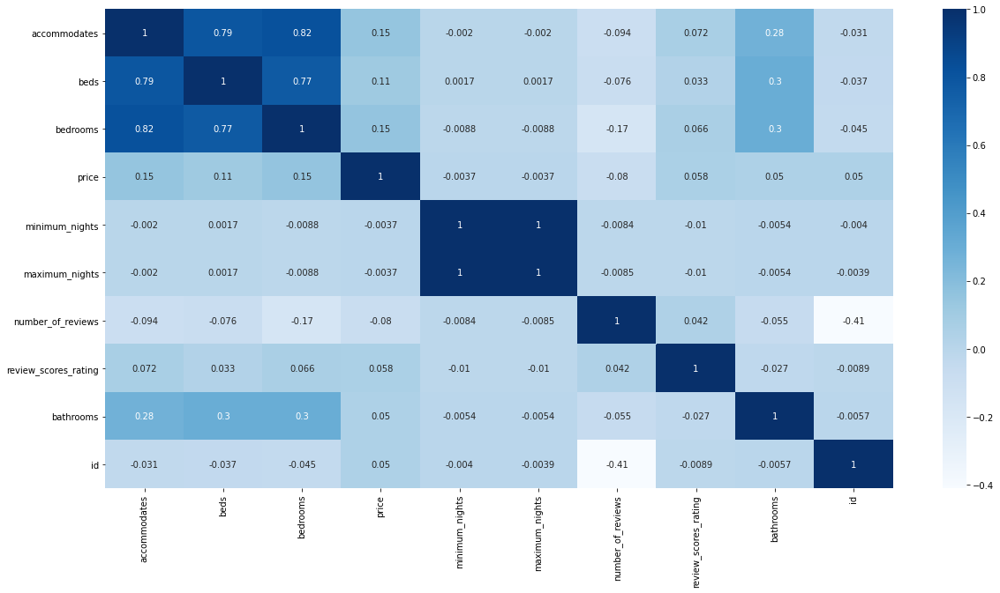

In [12]:
#creating correlation matrix: numerical values
plt.figure(figsize=(20,10))
cor = listing2num.corr()

sns.heatmap(cor, annot=True, cmap=plt.cm.Blues)
plt.show()

In [13]:
#print out top 7 highest correlations for numerical features
print(listing2num[["accommodates", "beds"]].corr())
print(listing2num[["accommodates", "bedrooms"]].corr())
print(listing2num[["beds", "bedrooms"]].corr())
print(listing2num[["accommodates", "bathrooms"]].corr())
print(listing2num[["beds", "bathrooms"]].corr())
print(listing2num[["bedrooms", "bathrooms"]].corr())
print(listing2num[["minimum_nights", "maximum_nights"]].corr())

              accommodates      beds
accommodates      1.000000  0.794203
beds              0.794203  1.000000
              accommodates  bedrooms
accommodates      1.000000  0.822869
bedrooms          0.822869  1.000000
              beds  bedrooms
beds      1.000000  0.773695
bedrooms  0.773695  1.000000
              accommodates  bathrooms
accommodates      1.000000   0.277608
bathrooms         0.277608   1.000000
               beds  bathrooms
beds       1.000000   0.301442
bathrooms  0.301442   1.000000
           bedrooms  bathrooms
bedrooms   1.000000   0.302898
bathrooms  0.302898   1.000000
                minimum_nights  maximum_nights
minimum_nights             1.0             1.0
maximum_nights             1.0             1.0


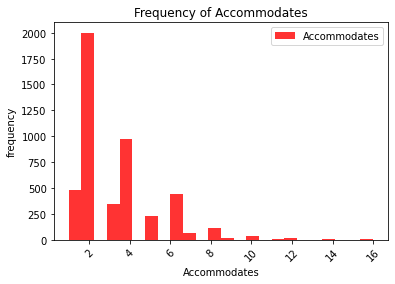

In [14]:
#other visualisations for numerical
import requests
import bs4 as bs
import pandas as pd
import numpy as np
import sklearn as sl
import sklearn.preprocessing as preprocessing
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

plt.hist(listing2num['accommodates'], bins = 24, color='r', label='Accommodates',alpha=0.8)
plt.title('Frequency of Accommodates')
plt.legend(loc='upper right')
plt.xlabel('Accommodates')
plt.ylabel('frequency')

plt.xticks(rotation = 45)
plt.show()

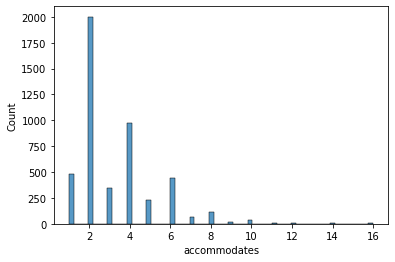

In [15]:
sns.histplot(listing2num.accommodates)

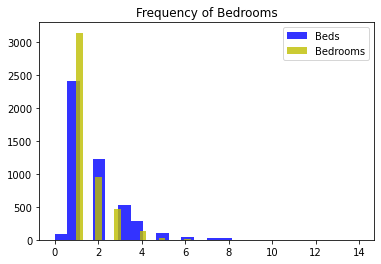

In [16]:
plt.hist(listing2num['beds'], bins = 24, color='b', label='Beds',alpha=0.8)
plt.title('Frequency of Beds')
plt.legend(loc='upper right')

plt.hist(listing2num['bedrooms'], bins = 24, color='y', label='Bedrooms',alpha=0.8)
plt.title('Frequency of Bedrooms')
plt.legend(loc='upper right')

plt.show()

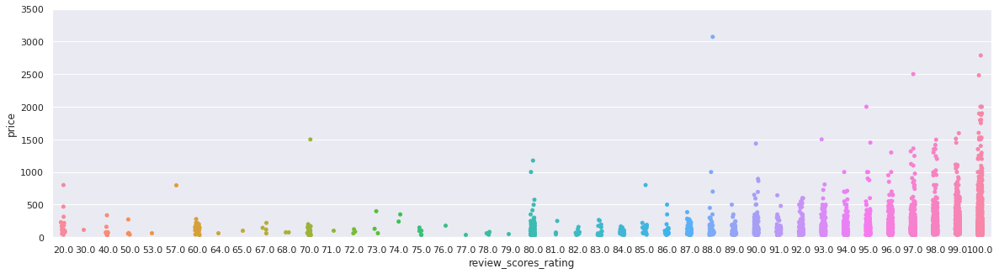

In [17]:
sns.set(rc={'figure.figsize':(20,5)})
review_vs_price = sns.stripplot(x='review_scores_rating', y='price', data = listing2num, jitter=True)
review_vs_price.set(ylim=(0, 3500))
plt.show()

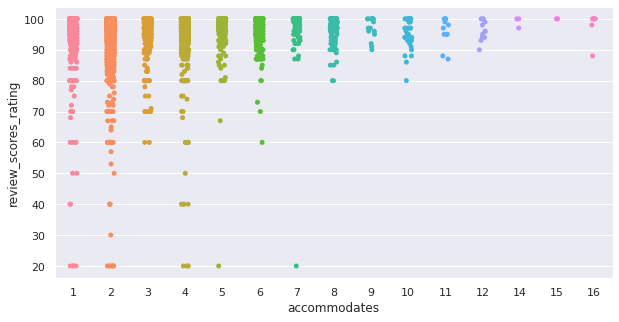

In [18]:
sns.set(rc={'figure.figsize':(10,5)})
sns.stripplot(x='accommodates', y='review_scores_rating', data = listing2num, jitter=True)
plt.show()

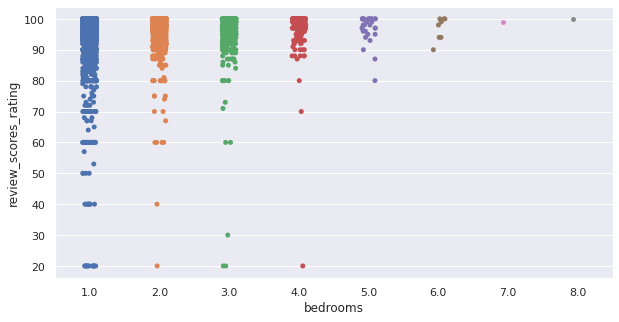

In [19]:
sns.set(rc={'figure.figsize':(10,5)})
sns.stripplot(x='bedrooms', y='review_scores_rating', data = listing2num, jitter=True)
plt.show()

**Visualizing with Categorical Features**

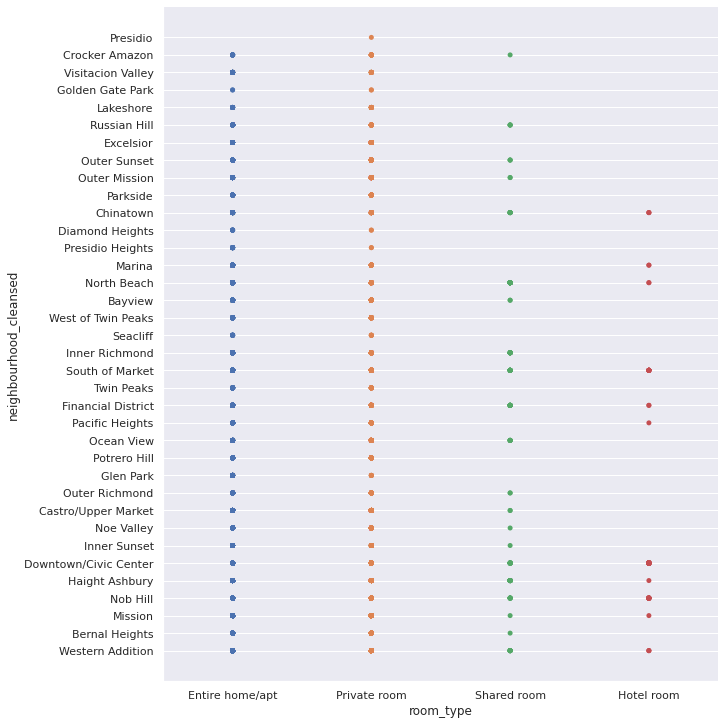

In [20]:
#neighbourhood_cleansed & room_type
listings2cat_2 = listings2cat[['neighbourhood_cleansed', "room_type"]]
listings2cat_d2 = pd.get_dummies(listings2cat_2) 
listings2cat_d2

sns.catplot(x="room_type", y="neighbourhood_cleansed", jitter=False, height=10, data=listings2cat_2)


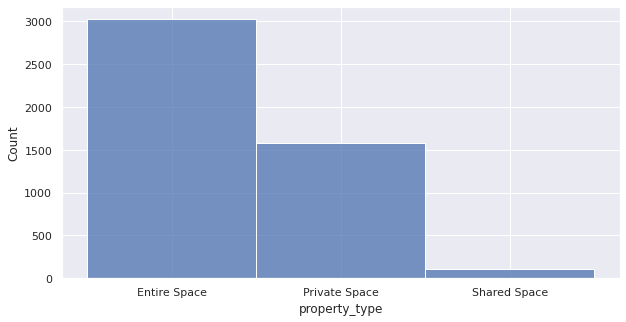

In [21]:
sns.histplot(listings_joined['property_type'])


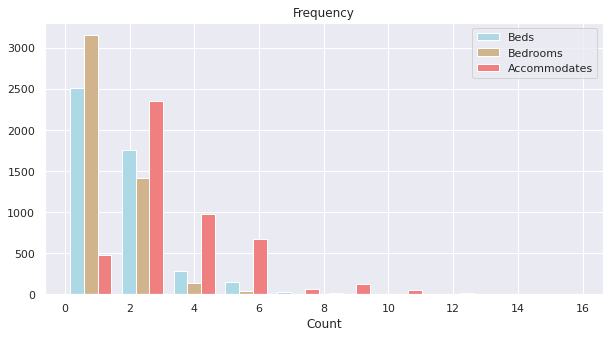

<Figure size 720x360 with 0 Axes>

In [22]:


x = [listing2num['beds'],listing2num['bedrooms'],listing2num['accommodates']]
plt.hist(x,color=['lightblue','tan','lightcoral']) 
plt.legend(["Beds","Bedrooms", "Accommodates"])
plt.title('Frequency')
plt.xlabel('Count')
plt.show()
plt.savefig(r'1.png')

## **3. TFIDF**

**We used TF-IDF to quantify each hosts description of their AirBnB in order to add a weight to each posting which can help us cluster better. TF-IDF is useful as it is a relative metric comparing across text only in our data.**

In [23]:
# "TF-IDF is a statistical measure that evaluates how relevant a word is to a document in a collection of documents. ... 
# It has many uses, most importantly in automated text analysis, and 
# is very useful for scoring words in machine learning algorithms for Natural Language Processing (NLP)."

# source: https://towardsdatascience.com/natural-language-processing-feature-engineering-using-tf-idf-e8b9d00e7e76

!python -m nltk.downloader stopwords

import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

/usr/lib/python3.6/runpy.py:125: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
  warn(RuntimeWarning(msg))
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [24]:
#cleaning the descriptions
from nltk.corpus import stopwords

def clean_text(string_in):
  string_in = re.sub("[^a-zA-Z]", " ", str(string_in))  # Replace all non-letters with spaces
  string_in = string_in.lower()                         # Tranform to lower case    
  return string_in.strip()

listings2nume["descriptions"] = listings2.name.apply(clean_text)

In [25]:
#TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer
data = listings2nume["descriptions"]

tf_idf_vectorizor = TfidfVectorizer(stop_words = 'english',#tokenizer = tokenize_and_stem,
                             max_features = 20000)
tf_idf = tf_idf_vectorizor.fit_transform(data)
tf_idf_norm = normalize(tf_idf)
tf_idf_array = tf_idf_norm.toarray()

In [26]:
scores = pd.DataFrame(tf_idf_array, columns=tf_idf_vectorizor.get_feature_names())
scores = np.mean(scores).sort_values(ascending=False).to_frame('Score').reset_index().rename(columns={'index':'Word'})
scores_dict = dict(zip(scores['Word'], scores['Score']))
listings2nume['TF_IDF_Weight'] = 0

desc = listings2nume['descriptions'].reset_index().drop('index',axis=1)
desc = [x.split() for x in listings2nume["descriptions"]]

scoreslist = []

for i in np.arange(len(listings2nume['descriptions'])):
  words = desc[i]
  scoresl = [scores_dict.get(i) for i in words]
  sc = [x for x in scoresl if x is not None]
  prod = np.nanmean(sc)
  scoreslist.append(prod)

len(scoreslist) == len(listings2nume['descriptions'])

listings2nume['TF_IDF_Weight'] = scoreslist

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app


In [27]:
listings2nume.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,id,property_type,descriptions,TF_IDF_Weight
0,3,2.0,1.0,131.0,2,30,262,97.0,1.0,958,Entire Space,bright modern garden unit br bth,0.014261
1,5,3.0,2.0,235.0,30,60,111,98.0,1.0,5858,Entire Space,creative sanctuary,0.001709
2,2,1.0,1.0,56.0,32,60,19,84.0,4.0,7918,Private Space,a friendly room ucsf usf san francisco,0.015606
3,1,1.0,1.0,45.0,5,21,85,95.0,2.0,8014,Private Space,newly remodeled room in big house wifi market,0.011536
4,2,1.0,1.0,56.0,32,90,8,93.0,4.0,8142,Private Space,friendly room apt style ucsf usf san franc...,0.013513


## **4. Sentiment Analysis**

**Performed sentiment analysis on customer comments to get an understanding of how positive or negative users experiences were with their stay at the different AirBnB's.**

In [28]:
listing_comments

,comments,listing_id
0,"Our experience was, without a doubt, a five st...",958
1,Returning to San Francisco is a rejuvenating t...,958
2,We were very pleased with the accommodations a...,958
3,We highly recommend this accomodation and agre...,958
4,Holly's place was great. It was exactly what I...,958
...,...,...
316512,It's a very nice place and Bennett is very res...,45483264
316513,Very nice room for a great price!,45483264
316514,Charming house with spacious 3 three bedrooms.,45542268
316515,I was the first one to stay and for a new memb...,45658379


In [29]:
# import Beautiful Soup, NumPy and Pandas, etc
import bs4 as bs
import numpy as np
import pandas as pd
import re
import hashlib
 
# download NLTK classifiers - these are cached locally on your machine
import nltk
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

# import ml classifiers
from nltk.tokenize import sent_tokenize # tokenizes sentences
from nltk.stem import PorterStemmer     # parsing/stemmer
from nltk.tag import pos_tag            # parts-of-speech tagging
from nltk.corpus import wordnet         # sentiment scores
from nltk.stem import WordNetLemmatizer # stem and context
from nltk.corpus import stopwords       # stopwords
from nltk.util import ngrams            # ngram iterator

# import word2vec
from gensim.test.utils import datapath
from gensim import utils
from gensim.models import Word2Vec

# import sklearn
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize, FunctionTransformer
from sklearn.feature_extraction.text import CountVectorizer

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [30]:
#to lowercase
listing_comments['comments'] = listing_comments['comments'].apply(lambda x: " ".join(x.lower() for x in x.split()))
listing_comments['comments']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0         our experience was, without a doubt, a five st...
1         returning to san francisco is a rejuvenating t...
2         we were very pleased with the accommodations a...
3         we highly recommend this accomodation and agre...
4         holly's place was great. it was exactly what i...
                                ...                        
316512    it's a very nice place and bennett is very res...
316513                    very nice room for a great price!
316514       charming house with spacious 3 three bedrooms.
316515    i was the first one to stay and for a new memb...
316516    great space which was clean and easy to get to...
Name: comments, Length: 316517, dtype: object

In [31]:
#strip punctuation
listing_comments['comments'] = listing_comments['comments'].str.replace('[^\w\s]','')
listing_comments['comments']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0         our experience was without a doubt a five star...
1         returning to san francisco is a rejuvenating t...
2         we were very pleased with the accommodations a...
3         we highly recommend this accomodation and agre...
4         hollys place was great it was exactly what i n...
                                ...                        
316512    its a very nice place and bennett is very resp...
316513                     very nice room for a great price
316514        charming house with spacious 3 three bedrooms
316515    i was the first one to stay and for a new memb...
316516    great space which was clean and easy to get to...
Name: comments, Length: 316517, dtype: object

In [32]:
#stopwords
stop = stopwords.words('english')
listing_comments['comments'] = listing_comments['comments'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
listing_comments['comments']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


0         experience without doubt five star experience ...
1         returning san francisco rejuvenating thrill ti...
2         pleased accommodations friendly neighborhood a...
3         highly recommend accomodation agree previous p...
4         hollys place great exactly needed perfect loca...
                                ...                        
316512    nice place bennett responsive nice person woul...
316513                                nice room great price
316514             charming house spacious 3 three bedrooms
316515    first one stay new member frank wasawesome pre...
316516    great space clean easy get plenty street parki...
Name: comments, Length: 316517, dtype: object

In [33]:
#stemming
st = PorterStemmer()
listing_comments['comments'] = listing_comments['comments'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))
listing_comments['comments']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


0         experi without doubt five star experi holli hu...
1         return san francisco rejuven thrill time enhan...
2         pleas accommod friendli neighborhood abl make ...
3         highli recommend accomod agre previou post hol...
4         holli place great exactli need perfect locat s...
                                ...                        
316512    nice place bennett respons nice person would d...
316513                                nice room great price
316514                   charm hous spaciou 3 three bedroom
316515    first one stay new member frank wasawesom pred...
316516    great space clean easi get plenti street park ...
Name: comments, Length: 316517, dtype: object

In [34]:
#sentiment scores for all comments

#first score is sentiment polarity (whether the sentiment is positive or negative 
#second score is subjectivity score (how subjective is the text)

from textblob import TextBlob
def senti(x):
    return TextBlob(x).sentiment  

listing_comments['senti_score'] = listing_comments['comments'].apply(senti)

listing_comments.senti_score.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


0                                  (0.4, 0.52)
1     (0.4000000000000001, 0.4166666666666667)
2    (0.25416666666666665, 0.3902777777777778)
3                           (0.58125, 0.69375)
4                 (0.4125, 0.5020833333333333)
Name: senti_score, dtype: object

In [35]:
#final table w/ senti_score
#range of polarity: -1 to 1(negative to positive)-- tells if text contains positive or negative feedback
listings_joined_dropped['sentiment'] = listing_comments.senti_score.apply(lambda x: x[0])
listings_joined_dropped.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,id,Entire Space,Private Space,Shared Space,sentiment
0,3,2.0,1.0,131.0,2,30,262,97.0,1.0,958,1,0,0,0.400000
1,5,3.0,2.0,235.0,30,60,111,98.0,1.0,5858,1,0,0,0.400000
2,2,1.0,1.0,56.0,32,60,19,84.0,4.0,7918,0,1,0,0.254167
3,1,1.0,1.0,45.0,5,21,85,95.0,2.0,8014,0,1,0,0.581250
4,2,1.0,1.0,56.0,32,90,8,93.0,4.0,8142,0,1,0,0.412500


In [36]:
listings_joined_dropped['tfidf_score'] = listings2nume['TF_IDF_Weight']
listings_joined_dropped.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,id,Entire Space,Private Space,Shared Space,sentiment,tfidf_score
0,3,2.0,1.0,131.0,2,30,262,97.0,1.0,958,1,0,0,0.400000,0.014261
1,5,3.0,2.0,235.0,30,60,111,98.0,1.0,5858,1,0,0,0.400000,0.001709
2,2,1.0,1.0,56.0,32,60,19,84.0,4.0,7918,0,1,0,0.254167,0.015606
3,1,1.0,1.0,45.0,5,21,85,95.0,2.0,8014,0,1,0,0.581250,0.011536
4,2,1.0,1.0,56.0,32,90,8,93.0,4.0,8142,0,1,0,0.412500,0.013513


In [37]:
listings_joined_dropped = listings_joined_dropped.drop(columns=['id'])

In [38]:
listings_joined_dropped.fillna(np.mean(listings_joined_dropped['tfidf_score']), inplace=True)

In [39]:
from sklearn import preprocessing

normalized_listings = listings_joined_dropped.values
min_max_scaler = preprocessing.MinMaxScaler()
normalized_listings = min_max_scaler.fit_transform(normalized_listings)
listings_final = pd.DataFrame(normalized_listings)

listings_final

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.133333,0.142857,0.000000,0.025916,0.000890,0.015899,0.318293,0.9625,0.1,1.0,0.0,0.0,0.647059,0.314891
1,0.266667,0.214286,0.142857,0.048190,0.025801,0.032346,0.134146,0.9750,0.1,1.0,0.0,0.0,0.647059,0.035339
2,0.066667,0.071429,0.000000,0.009852,0.027580,0.032346,0.021951,0.8000,0.4,0.0,1.0,0.0,0.561275,0.344839
3,0.000000,0.071429,0.000000,0.007496,0.003559,0.010965,0.102439,0.9375,0.2,0.0,1.0,0.0,0.753676,0.254183
4,0.066667,0.071429,0.000000,0.009852,0.027580,0.048794,0.008537,0.9125,0.4,0.0,1.0,0.0,0.654412,0.298218
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4715,0.066667,0.071429,0.000000,0.013279,0.000000,0.007675,0.002439,1.0000,0.1,0.0,1.0,0.0,0.592157,0.500738
4716,0.066667,0.071429,0.000000,0.017655,0.000000,0.014803,0.003659,1.0000,0.1,1.0,0.0,0.0,0.882353,0.309261
4717,0.066667,0.142857,0.000000,0.005354,0.000890,0.015351,0.002439,1.0000,0.3,0.0,1.0,0.0,0.730392,0.401591
4718,0.333333,0.214286,0.285714,0.051189,0.000890,0.014803,0.000000,1.0000,0.1,1.0,0.0,0.0,0.620915,0.342819


## **5. KMeans Clustering**

**Finally, clustering! Grouping up our data to see what kind of similarities our algorithm can come up with!**





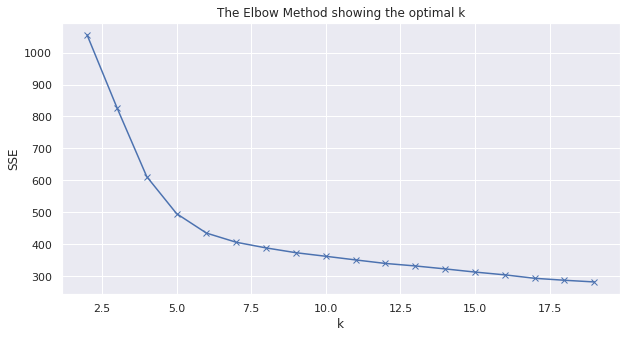

In [40]:
 #kmeans 
kvalues = np.arange(2, 20)
accuracy = []
clustervariance = {}
for k in kvalues:
  kmeans = KMeans(n_clusters=k, random_state=42)
  kmeans.fit(listings_final)
  score = silhouette_score(listings_final, kmeans.labels_)
  accuracy.append(score)
  clustervariance[k] = kmeans.inertia_
#plotting elbow chart
plt.plot(kvalues, list(clustervariance.values()), 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title('The Elbow Method showing the optimal k')
plt.show()


In [41]:
def cluster_queen(df,k):
  kmeans = KMeans(n_clusters=k, random_state=42)
  kmeans.fit(df) 
  cluster_labels = kmeans.labels_

  # assign these clusters back into the dataframe
  df = df.assign(cluster=cluster_labels)
  return df

In [42]:
listings_joined_dropped.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,Entire Space,Private Space,Shared Space,sentiment,tfidf_score
0,3,2.0,1.0,131.0,2,30,262,97.0,1.0,1,0,0,0.400000,0.014261
1,5,3.0,2.0,235.0,30,60,111,98.0,1.0,1,0,0,0.400000,0.001709
2,2,1.0,1.0,56.0,32,60,19,84.0,4.0,0,1,0,0.254167,0.015606
3,1,1.0,1.0,45.0,5,21,85,95.0,2.0,0,1,0,0.581250,0.011536
4,2,1.0,1.0,56.0,32,90,8,93.0,4.0,0,1,0,0.412500,0.013513


In [43]:
listings_joined_dropped = cluster_queen(listings_joined_dropped, 5)
listings_joined_dropped.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,Entire Space,Private Space,Shared Space,sentiment,tfidf_score,cluster
0,3,2.0,1.0,131.0,2,30,262,97.0,1.0,1,0,0,0.400000,0.014261,1
1,5,3.0,2.0,235.0,30,60,111,98.0,1.0,1,0,0,0.400000,0.001709,1
2,2,1.0,1.0,56.0,32,60,19,84.0,4.0,0,1,0,0.254167,0.015606,1
3,1,1.0,1.0,45.0,5,21,85,95.0,2.0,0,1,0,0.581250,0.011536,1
4,2,1.0,1.0,56.0,32,90,8,93.0,4.0,0,1,0,0.412500,0.013513,1


In [44]:
listings_joined_dropped.groupby('cluster').mean()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,Entire Space,Private Space,Shared Space,sentiment,tfidf_score
cluster,,,,,,,,,,,,,,
0,6.087500,3.187500,2.787500,929.983875,5.787500,1124.362500,28.837500,96.525000,2.125000,0.950000,0.037500,0.012500,0.387919,0.012518
1,2.869216,1.642830,1.323518,141.810432,12.762141,87.991205,78.697514,95.988910,1.250478,0.570554,0.404207,0.025239,0.396504,0.014283
2,5.761307,3.218593,2.690955,553.053492,8.964824,62.949749,28.110553,97.648241,1.846734,0.964824,0.035176,0.000000,0.392941,0.011975
3,3.109443,1.731707,1.442151,165.739537,21.899937,1121.009381,43.919325,94.298937,1.293934,0.654784,0.317073,0.028143,0.395638,0.013660
4,8.357143,4.928571,3.821429,1890.989643,7.142857,212.714286,17.428571,97.142857,2.607143,0.857143,0.142857,0.000000,0.387720,0.010725


In [45]:
lat = listings.latitude
lon = listings.longitude
neighbourhood_cleansed = listings.neighbourhood_cleansed
name = listings.name
space = listings.property_type

## **6. User Interface**
**Visualizing our clusters on a map of San Francisco. These colour-coded visuals can directly be used by people looking to stay in AirBnB's to find the best fit for them! We employed recursive clustering to allow for a more narrow search!**

In [46]:
!pip install geopandas
!pip install folium

     |████████████████████████████████| 972kB 10.0MB/s 
     |████████████████████████████████| 6.5MB 20.5MB/s 
     |████████████████████████████████| 14.8MB 305kB/s 


In [47]:
import geopandas as gpd
import folium
from shapely.geometry import Point, Polygon
crs = {'init': 'epsg:4326'}

In [48]:
def mapping(df, lon, lat, name, neighbourhood_cleansed, space):
  df['latitude'] = lat
  df['longitude'] = lon
  geo_df = gpd.GeoDataFrame(df, crs=crs, geometry=gpd.points_from_xy(df.longitude, df.latitude))
  geo_df['neighborhood'] = neighbourhood_cleansed
  geo_df['name'] = name
  geo_df['space'] = space

  m1 = folium.Map(location=[37.79, -122.41], zoom_start=14.5)
  folium.GeoJson(geo_df.geometry).add_to(m1)

  for row in geo_df.iterrows():
    row_values = row[1]
    center_point = row_values['geometry']
    location = [center_point.y, center_point.x]
    if row_values['cluster'] == 0:
      marker_color = 'lightred'
    elif row_values['cluster'] == 1:
      marker_color = 'blue'
    elif row_values['cluster'] == 2:
      marker_color = 'lightgreen'
    elif row_values['cluster'] == 3:
      marker_color = 'pink'
    else:
      marker_color = 'lightblue'
    popup = ('Name: ' + str(row_values['name']) + '\n' + 'Price: $' + str(row_values['price']) + '\n' + 'Rating: ' + str(row_values['review_scores_rating'])
    + '\n' + 'Bedrooms: ' + str(row_values['bedrooms']) + '\n' + 'Type: ' + str(row_values['space']) + '\n' + 'Neighborhood: ' + str(row_values['neighborhood']))
    marker = folium.Marker(location = location, popup = popup, icon=folium.Icon(color=marker_color, icon='home'))
    marker.add_to(m1)

  display(m1)
  return geo_df

In [49]:
new_df = mapping(listings_joined_dropped,lon,lat,name,neighbourhood_cleansed, space)

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [50]:
cluster_dict = {"lightred" :0,"blue":1,"lightgreen":2,"pink":3,"lightblue":4}

In [51]:
green = new_df[new_df['cluster'] == cluster_dict['lightgreen']]
red = new_df[new_df['cluster'] == cluster_dict['lightred']]
blue = new_df[new_df['cluster'] == cluster_dict['blue']]
print(len(green),len(red),len(blue))

398 80 2615


*Which cluster do you want to explore? Choose a color.*


In [52]:
color = "blue"

In [53]:
df_blue = new_df[new_df['cluster'] == cluster_dict[color]]
name = df_blue["name"]
neighbourhood_cleansed = df_blue["neighborhood"]
lon = df_blue["longitude"]
lat = df_blue["latitude"]
space = df_blue["space"]
df_blue = df_blue.drop(columns= ["longitude","latitude","neighborhood","name","cluster","geometry", "space"])
df_blue.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,Entire Space,Private Space,Shared Space,sentiment,tfidf_score
0,3,2.0,1.0,131.0,2,30,262,97.0,1.0,1,0,0,0.400000,0.014261
1,5,3.0,2.0,235.0,30,60,111,98.0,1.0,1,0,0,0.400000,0.001709
2,2,1.0,1.0,56.0,32,60,19,84.0,4.0,0,1,0,0.254167,0.015606
3,1,1.0,1.0,45.0,5,21,85,95.0,2.0,0,1,0,0.581250,0.011536
4,2,1.0,1.0,56.0,32,90,8,93.0,4.0,0,1,0,0.412500,0.013513


In [54]:
 listings_joined_dropped_blue = cluster_queen(df_blue, 5)

In [55]:
df_blue_map = mapping(listings_joined_dropped_blue, lon, lat, name, neighbourhood_cleansed, space)

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


*Which cluster do you want to explore next? Choose a color.*

In [56]:
color = "pink"

In [57]:
df_pink = new_df[new_df['cluster'] == cluster_dict[color]]
name = df_pink["name"]
neighbourhood_cleansed = df_pink["neighborhood"]
lon = df_pink["longitude"]
lat = df_pink["latitude"]
space = df_pink["space"]
df_pink = df_pink.drop(columns= ["longitude","latitude","neighborhood","name","cluster","geometry", "space"])
df_pink.head()

,accommodates,beds,bedrooms,price,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,bathrooms,Entire Space,Private Space,Shared Space,sentiment,tfidf_score
9,3,3.0,3.0,170.0,30,1125,37,89.0,1.0,1,0,0,0.172237,0.012920
22,1,1.0,1.0,79.0,1,1125,204,96.0,1.0,0,1,0,0.444444,0.015195
27,2,1.0,1.0,119.0,30,1125,133,100.0,1.0,1,0,0,0.377778,0.010336
32,2,1.0,1.0,107.0,30,1125,21,95.0,1.0,1,0,0,0.256250,0.003370
38,3,2.0,1.0,129.0,30,730,16,99.0,1.0,1,0,0,0.000000,0.015367


In [58]:
listings_joined_dropped_pink = cluster_queen(df_pink, 3)

In [59]:
df_pink_map = mapping(listings_joined_dropped_pink, lon, lat, name, neighbourhood_cleansed, space)

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
